In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!tar -xvf /content/drive/My\ Drive/project2/food-101.tar.gz > /dev/null 2>&1

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as img
import numpy as np
# from imageio import imresize

%matplotlib inline

import os
from os import listdir
from os.path import isfile, join
import shutil
import stat
import collections
from collections import defaultdict

from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets

import h5py
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
from keras.applications.inception_v3 import preprocess_input
from keras.models import load_model

Using TensorFlow backend.


In [ ]:
!ls /content/food-101/images

apple_pie	    eggs_benedict	     onion_rings
baby_back_ribs	    escargots		     oysters
baklava		    falafel		     pad_thai
beef_carpaccio	    filet_mignon	     paella
beef_tartare	    fish_and_chips	     pancakes
beet_salad	    foie_gras		     panna_cotta
beignets	    french_fries	     peking_duck
bibimbap	    french_onion_soup	     pho
bread_pudding	    french_toast	     pizza
breakfast_burrito   fried_calamari	     pork_chop
bruschetta	    fried_rice		     poutine
caesar_salad	    frozen_yogurt	     prime_rib
cannoli		    garlic_bread	     pulled_pork_sandwich
caprese_salad	    gnocchi		     ramen
carrot_cake	    greek_salad		     ravioli
ceviche		    grilled_cheese_sandwich  red_velvet_cake
cheesecake	    grilled_salmon	     risotto
cheese_plate	    guacamole		     samosa
chicken_curry	    gyoza		     sashimi
chicken_quesadilla  hamburger		     scallops
chicken_wings	    hot_and_sour_soup	     seaweed_salad
chocolate_cake	    hot_dog		     shrimp_and_grits
chocolate_mousse    huevo

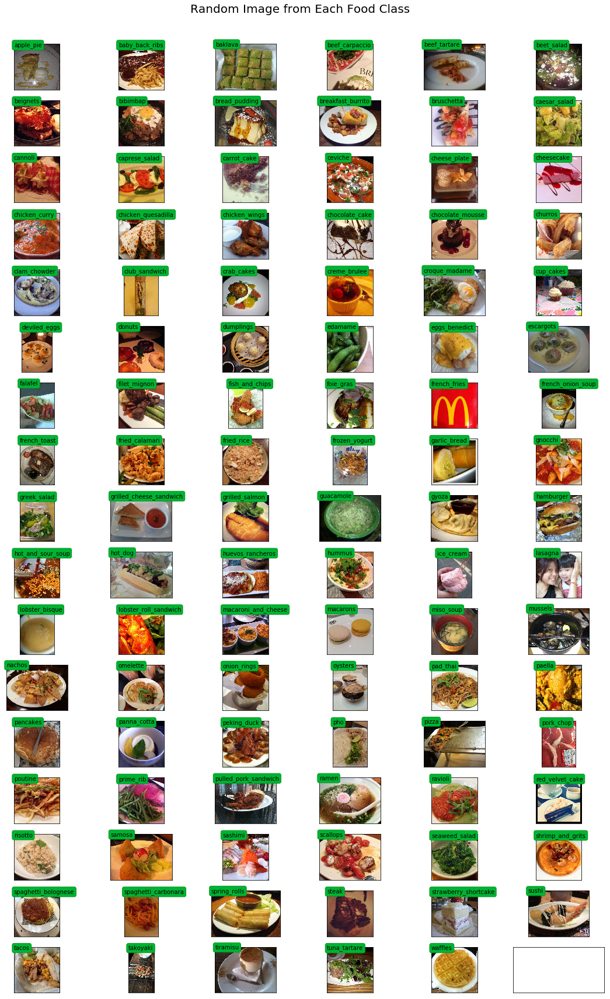

In [ ]:
root_dir = 'food-101/images/'
rows = 17
cols = 6
fig, ax = plt.subplots(rows, cols, frameon=False, figsize=(15, 25))
fig.suptitle('Random Image from Each Food Class', fontsize=20)
sorted_food_dirs = sorted(os.listdir(root_dir))
for i in range(rows):
    for j in range(cols):
        try:
            food_dir = sorted_food_dirs[i*cols + j]
        except:
            break
        all_files = os.listdir(os.path.join(root_dir, food_dir))
        rand_img = np.random.choice(all_files)
        img = plt.imread(os.path.join(root_dir, food_dir, rand_img))
        ax[i][j].imshow(img)
        ec = (0, .6, .1)
        fc = (0, .7, .2)
        ax[i][j].text(0, -20, food_dir, size=10, rotation=0,
                ha="left", va="top", 
                bbox=dict(boxstyle="round", ec=ec, fc=fc))
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [ ]:
class_to_ix = {}
ix_to_class = {}
with open('food-101/meta/classes.txt', 'r') as txt:
    classes = [l.strip() for l in txt.readlines()]
    class_to_ix = dict(zip(classes, range(len(classes))))
    ix_to_class = dict(zip(range(len(classes)), classes))
    class_to_ix = {v: k for k, v in ix_to_class.items()}
sorted_class_to_ix = collections.OrderedDict(sorted(class_to_ix.items()))

In [ ]:
%%capture
import os
from collections import defaultdict
import shutil, sys 

if not os.path.isdir('/content/food-101/test') or not os.path.isdir('/content/food-101/train'):

    def copytree(src, dst, symlinks = False, ignore = None):
        if not os.path.exists(dst):
            os.makedirs(dst)
            shutil.copystat(src, dst)
        lst = os.listdir(src)
        if ignore:
            excl = ignore(src, lst)
            lst = [x for x in lst if x not in excl]
        for item in lst:
            s = os.path.join(src, item)
            d = os.path.join(dst, item)
            if symlinks and os.path.islink(s):
                if os.path.lexists(d):
                    os.remove(d)
                os.symlink(os.readlink(s), d)
                try:
                    st = os.lstat(s)
                    mode = stat.S_IMODE(st.st_mode)
                    os.lchmod(d, mode)
                except:
                    pass # lchmod not available
            elif os.path.isdir(s):
                copytree(s, d, symlinks, ignore)
            else:
                shutil.copy2(s, d)

    def generate_dir_file_map(path):
        dir_files = defaultdict(list)
        with open(path, 'r') as txt:
            files = [l.strip() for l in txt.readlines()]
            for f in files:
                dir_name, id = f.split('/')
                dir_files[dir_name].append(id + '.jpg')
        return dir_files

    train_dir_files = generate_dir_file_map('/content/food-101/meta/train.txt')
    test_dir_files = generate_dir_file_map('/content/food-101/meta/test.txt')


    def ignore_train(d, filenames):
        print(d)
        subdir = d.split('/')[-1]
        to_ignore = train_dir_files[subdir]
        return to_ignore

    def ignore_test(d, filenames):
        print(d)
        subdir = d.split('/')[-1]
        to_ignore = test_dir_files[subdir]
        return to_ignore

    copytree('/content/food-101/images', '/content/food-101/test', ignore=ignore_train)
    copytree('/content/food-101/images', '/content/food-101/train', ignore=ignore_test)
    
else:
    print('Train/Test files already copied into separate folders.')

In [ ]:
def setup_generator(train_path, test_path, batch_size, dimentions):
    train_datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1. / 255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

    test_datagen = ImageDataGenerator(rescale=1. / 255)

    train_generator = train_datagen.flow_from_directory(
        train_path,  # this is the target directory
        target_size=dimentions,
        batch_size=batch_size)

    validation_generator = test_datagen.flow_from_directory(
        test_path, # this is the target directory
        target_size=dimentions,
        batch_size=batch_size)

    return train_generator, validation_generator

In [ ]:
shape = (299, 299, 3)
batch_size=64
test = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
        '/content/drive/My Drive/project2/test', # this is the target directory
        target_size=shape[:2],
        batch_size=batch_size)

Found 10 images belonging to 1 classes.


In [ ]:
from __future__ import print_function
from __future__ import division

from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from keras.applications.resnet50 import ResNet50
from keras.layers import GlobalAveragePooling2D, Dropout
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model
from keras.layers import Dense
from keras.layers import Input
import numpy as np
import argparse


In [ ]:
shape = (299, 299, 3)
batch_size=64
X_train, X_test = setup_generator('/content/food-101/train', '/content/food-101/test', batch_size, shape[:2])


Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.


In [ ]:
x = [0.2252,0.4016,0.5115,0.5512,0.6696,0.7196,0.7534,0.7780,0.7979,0.8147,0.8288,0.8440,0.8542,0.8660,0.8771,0.8876,0.8977,0.9040,0.9140,0.9450,0.9565,0.9633,0.9640,0.9652,0.9672,0.9770,0.9765,0.9768,0.9770,0.9800]
y = [0.3014,0.4216,0.5626,0.5814,0.6642,0.6702,0.6003,0.7243,0.7223,0.7694,0.7731,0.7955,0.7519,0.7885,0.7640,0.7723,0.7790,0.7812,0.7800,0.7888,0.7979,0.7961,0.8008,0.8103,0.8696,0.8696,0.8676,0.8709,0.8745,0.8742]

1184

In [ ]:
model = load_model(filepath='/content/drive/My Drive/project2/iv3_original/lan2/model4.17-0.56.hdf5')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [ ]:
x = model.predict_generator(X_test,X_test.samples//batch_size+1 )


In [ ]:
y = model.predict_generator(X_test,X_test.samples//batch_size )


In [ ]:
len(y)

25186

In [ ]:
len(x)

25250

In [ ]:
for i in x:
    print(ix_to_class[np.argmax(i)])
    

hummus
carrot_cake
chicken_quesadilla
baby_back_ribs
carrot_cake
chicken_quesadilla
seaweed_salad
carrot_cake
hot_dog
chocolate_cake


In [ ]:
scores = model.evaluate_generator(X_test,X_test.samples//batch_size+1 )

In [ ]:
print("Test accuracy: ",scores[1])
print("Test loss: ",scores[0])

Test accuracy:  0.873188118774112
Test loss:  0.5639568662973914


In [ ]:
scores = model.evaluate_generator(X_test,X_test.samples//batch_size )

In [ ]:
print("Test accuracy: ",scores[1])
print("Test loss: ",scores[0])

Test accuracy:  0.8730644008244872
Test loss:  0.5612122061651504


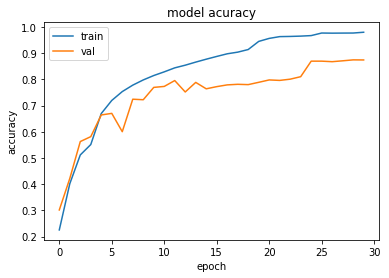

In [ ]:
import matplotlib.pyplot as plt
plt.plot(x)
plt.plot(y)
plt.title('model acuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
def center_crop(x, center_crop_size, **kwargs):
    centerw, centerh = x.shape[0]//2, x.shape[1]//2
    halfw, halfh = center_crop_size[0]//2, center_crop_size[1]//2
    return x[centerw-halfw:centerw+halfw+1,centerh-halfh:centerh+halfh+1, :]

In [ ]:
def predict_10_crop(img, ix, top_n=5, plot=False, preprocess=True, debug=False):
    flipped_X = np.fliplr(img)
    crops = [
        img[:299,:299, :], # Upper Left
        img[:299, img.shape[1]-299:, :], # Upper Right
        img[img.shape[0]-299:, :299, :], # Lower Left
        img[img.shape[0]-299:, img.shape[1]-299:, :], # Lower Right
        center_crop(img, (299, 299)),
        
        flipped_X[:299,:299, :],
        flipped_X[:299, flipped_X.shape[1]-299:, :],
        flipped_X[flipped_X.shape[0]-299:, :299, :],
        flipped_X[flipped_X.shape[0]-299:, flipped_X.shape[1]-299:, :],
        center_crop(flipped_X, (299, 299))
    ]
    if preprocess:
        crops = [preprocess_input(x.astype('float32')) for x in crops]

    if plot:
        fig, ax = plt.subplots(2, 5, figsize=(10, 4))
        ax[0][0].imshow(crops[0])
        ax[0][1].imshow(crops[1])
        ax[0][2].imshow(crops[2])
        ax[0][3].imshow(crops[3])
        ax[0][4].imshow(crops[4])
        ax[1][0].imshow(crops[5])
        ax[1][1].imshow(crops[6])
        ax[1][2].imshow(crops[7])
        ax[1][3].imshow(crops[8])
        ax[1][4].imshow(crops[9])
    
    y_pred = model.predict(np.array(crops))
    preds = np.argmax(y_pred, axis=1)
    top_n_preds= np.argpartition(y_pred, -top_n)[:,-top_n:]
    if debug:
        print('Top-1 Predicted:', preds)
        print('Top-5 Predicted:', top_n_preds)
        print('True Label:', y_test[ix])
    return preds, top_n_preds

apple_pie


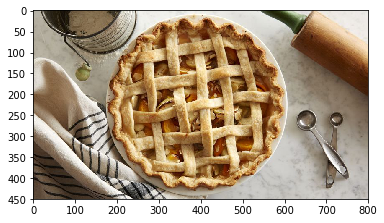

In [ ]:
# from selenium import webdriver as driver
from six.moves import urllib
link = 'https://images-gmi-pmc.edge-generalmills.com/9eedf46b-bdae-4b7d-aca5-4909afc7eb7d.jpg'

predict_remote_image(url=link)

In [ ]:
def show_images_prediction(page=0):
    page_size = 20
    nrows = 4
    ncols = 5
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 12))
    fig.set_size_inches(12, 8)
    #fig.tight_layout()
    #imgs = np.random.choice((y_all == n_class).nonzero()[0], nrows * ncols)
    start_i = page * page_size
    for i, ax in enumerate(axes.flat):
        im = ax.imshow(X_test[i+start_i])
        ax.set_axis_off()
        ax.title.set_visible(False)
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)
        predicted = ix_to_class[y_pred[i+start_i]]
        match = predicted ==  ix_to_class[y_test[start_i + i]]
        ec = (1, .5, .5)
        fc = (1, .8, .8)
        if match:
            ec = (0, .6, .1)
            fc = (0, .7, .2)
        # predicted label
        ax.text(0, 400, 'P: ' + predicted, size=10, rotation=0,
            ha="left", va="top",
             bbox=dict(boxstyle="round",
                   ec=ec,
                   fc=fc,
                   )
             )
        if not match:
            # true label
            ax.text(0, 480, 'A: ' + ix_to_class[y_test[start_i + i]], size=10, rotation=0,
                ha="left", va="top",
                 bbox=dict(boxstyle="round",
                       ec=ec,
                       fc=fc,
                       )
                 )
    plt.subplots_adjust(left=0, wspace=1, hspace=0)
    plt.show()

In [ ]:
# from keras.preprocessing import image

# img_path = '/content/food-101/images/apple_pie/1043283.jpg'
# img = image.load_img(img_path, target_size=(299, 299))
# img_tensor = image.img_to_array(img)
# img_tensor = np.expand_dims(img_tensor, axis=0)
# # predict = model.predict_generator(test_generator,steps = nb_samples)

# preds = model.predict_generator(Test,steps = nb_samples)
# img_tensor /= 255.
# plt.imshow(img_tensor[0])
# plt.imshow(img_tensor[0])
# print(preds)
# plt.show()

In [ ]:
# ix_to_class[np.argmax(preds)]

In [ ]:
import matplotlib.image as img
pic_path = '/content/food-101/images/apple_pie/1043283.jpg'
pic = img.imread(pic_path)
preds = predict_10_crop(np.array(pic), 0)[0]
# print(preds)
best_pred = collections.Counter(preds).most_common(1)[0][0]
# print(best_pred)

print(ix_to_class[best_pred])
fig, ax = plt.subplots(1,2,figsize=(10, 4))
# ax[0].imshow(np.array(pic))
# ax[1].imshow(np.array(pic))    
plt.imshow()
plt.show()

NameError: ignored

In [ ]:
def predict_remote_image(url='http://themodelhouse.tv/wp-content/uploads/2016/08/hummus.jpg'):
    with urllib.request.urlopen(url) as f:
        pic = plt.imread(f, format='jpg')
        preds = predict_10_crop(np.array(pic), 0)[0]
        best_pred = collections.Counter(preds).most_common(1)[0][0]
        print(ix_to_class[best_pred])
        plt.imshow(pic)


In [ ]:
import os
files = os.listdir('/content/drive/My Drive/project2/test')

In [ ]:
files

['carrot_cake.jpg',
 'sushi.jpg',
 'carrot_cake2.jpg',
 'hot_dog.jpg',
 'chocolate_cake.jpg',
 'chickern_quesadilla.jpg',
 'icream.jpg',
 'chickern_quesadilla2.jpg',
 'carrot_cake1.jpg',
 'chocolate_cake1.jpg']

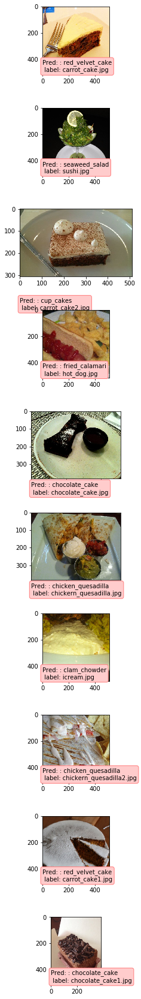

In [ ]:
import matplotlib.image as img
import os
files = os.listdir('/content/drive/My Drive/project2/test/test')
list_pic = []
list_pred = []
path_folder = '/content/drive/My Drive/project2/test/'
model.predict_generator()
# c = -1
# for i in files:
#     pic_path = path_folder + i
#     pic = img.imread(pic_path)
#     list_pic.append(pic)
#     preds = predict_10_crop(np.array(pic), 0)[0]
#     # print(preds)
#     best_pred = collections.Counter(preds).most_common(1)[0][0]
#     list_pred.append(ix_to_class[best_pred])
    # print(best_pred)
#     print(ix_to_class[best_pred])
ec = (1, .5, .5)
fc = (1, .8, .8)
fig, ax = plt.subplots(10,figsize=(30, 30))

for i in range(len(files)):
    ax[i].imshow(np.array(list_pic[i]))
    ax[i].text(0, 400, 'Pred: : ' + list_pred[i] + '\n' +' label: '+ files[i], rotation=0,
            ha="left", va="top",
             bbox=dict(boxstyle="round",
                   ec=ec,
                   fc=fc,
                   )
             )

# plt.imshow()
plt.subplots_adjust(left=0, wspace=0.5, hspace=0.5)
plt.show()

Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.


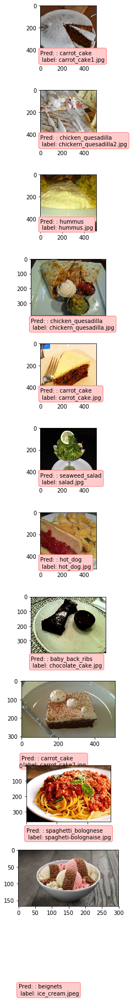

In [ ]:
import matplotlib.image as img
files = listdir('/content/drive/My Drive/project2/test/test')
list_pic = []
list_pred = []
path_folder = '/content/drive/My Drive/project2/test/'
# c = -1

# pred = ix_to_class[np.argmax(pred)]
# for i in files:
#     pic_path = path_folder + i
#     pic = img.imread(pic_path)
#     list_pic.append(pic)
#     preds = predict_10_crop(np.array(pic), 0)[0]
#     # print(preds)
#     best_pred = collections.Counter(preds).most_common(1)[0][0]
#     list_pred.append(ix_to_class[best_pred])
    # print(best_pred)
#     print(ix_to_class[best_pred])
ec = (1, .5, .5)
fc = (1, .8, .8)
fig, ax = plt.subplots(len(files),figsize=(30, 30))
dst = '/content/test/test'
for i in range(len(files)):
    src = '/content/drive/My Drive/project2/test/test/' +files[i]
    copy(src,dst)
    test = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    '/content/test', # this is the target directory
    target_size=shape[:2],
    batch_size=batch_size)
    pred = model.predict_generator(test,1)
    pred = ix_to_class[np.argmax(pred[-1])]
    pic_path = dst +'/'+ files[i]
#     print(pic_path)
    pic = img.imread(pic_path)
    ax[i].imshow(np.array(pic))
    ax[i].text(0, 400, 'Pred: : ' + pred + '\n' +' label: '+ files[i], rotation=0,
            ha="left", va="top",
             bbox=dict(boxstyle="round",
                   ec=ec,
                   fc=fc,
                   )
             )
    os.remove(dst + '/' + files[i])
# plt.imshow()
plt.subplots_adjust(left=0, wspace=0.5, hspace=0.5)
plt.show()

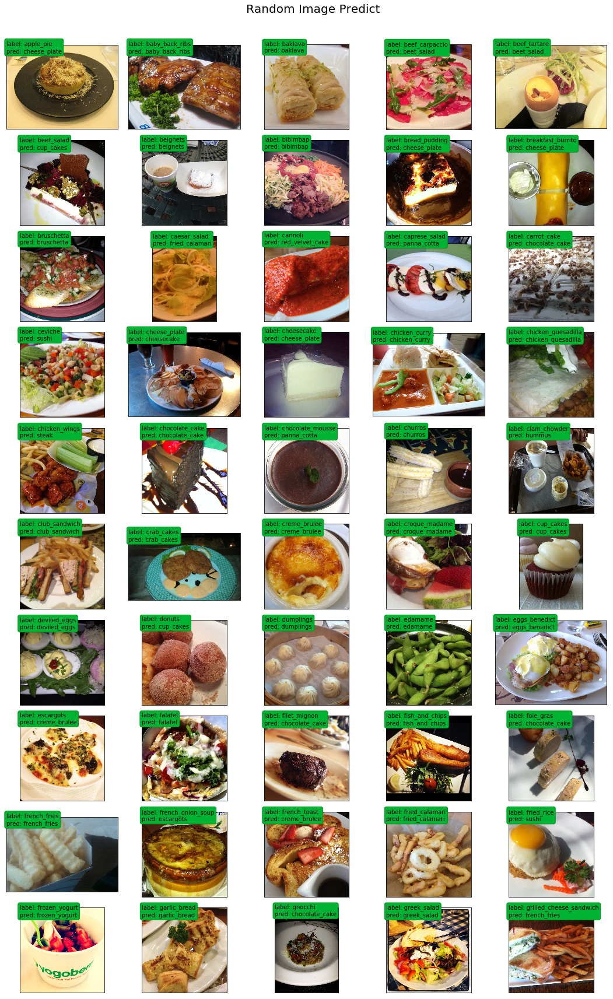

In [ ]:
root_dir = 'food-101/images/'
rows = 10
cols = 5
fig, ax = plt.subplots(rows, cols, frameon=False, figsize=(15, 25))
fig.suptitle('Random Image Predict', fontsize=20)
sorted_food_dirs = sorted(os.listdir(root_dir))

for i in range(rows):
    for j in range(cols):
        try:
            food_dir = sorted_food_dirs[i*cols + j]
        except:
            break
        all_files = os.listdir(os.path.join(root_dir, food_dir))
        rand_img = np.random.choice(all_files)
        img = plt.imread(os.path.join(root_dir, food_dir, rand_img))
        while (np.array(img).shape[1] < 299 or np.array(img).shape[0] < 299):
            rand_img = np.random.choice(all_files)
            img = plt.imread(os.path.join(root_dir, food_dir, rand_img))
#             print('a')
        preds = predict_10_crop(np.array(img), 0)[0]
    # print(preds)
        best_pred = collections.Counter(preds).most_common(1)[0][0]
        pred = ix_to_class[best_pred]
        ax[i][j].imshow(img)
        ec = (0, .6, .1)
        fc = (0, .7, .2)
        ax[i][j].text(0, -20, "label: "+food_dir+ '\n'+'pred: ' + pred , size=10, rotation=0,
                ha="left", va="top", 
                bbox=dict(boxstyle="round", ec=ec, fc=fc))
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [ ]:
!rm -r test
!mkdir -p test/test

Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging to 2 classes.
Found 1 images belonging 

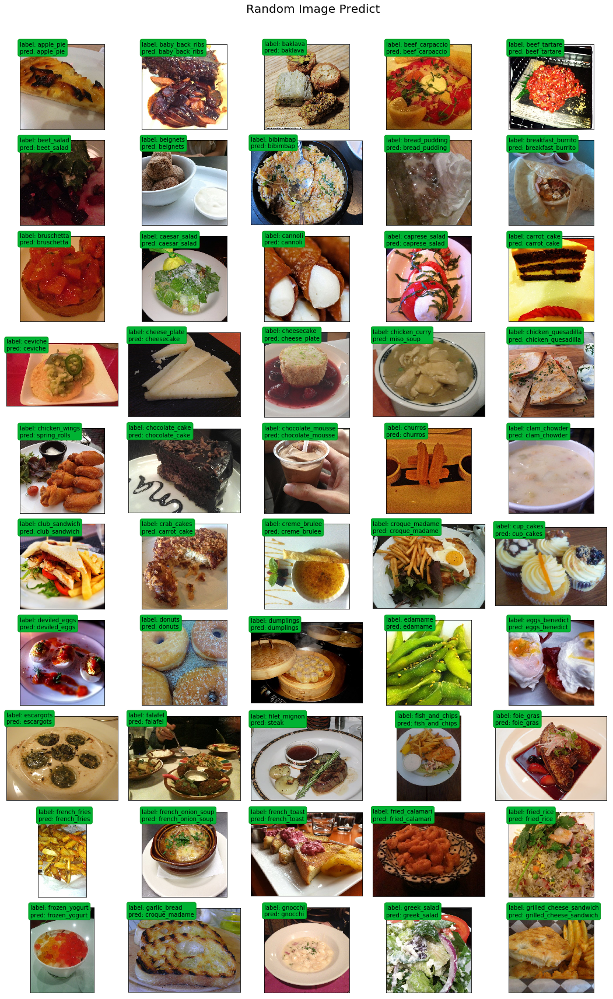

In [ ]:
from shutil import copy
dst = '/content/test/test'
root_dir = 'food-101/images/'
rows = 10
cols = 5
fig, ax = plt.subplots(rows, cols, frameon=False, figsize=(15, 25))
fig.suptitle('Random Image Predict', fontsize=20)
sorted_food_dirs = sorted(os.listdir(root_dir))

for i in range(rows):
    for j in range(cols):
        try:
            food_dir = sorted_food_dirs[i*cols + j]
        except:
            break
        all_files = os.listdir(os.path.join(root_dir, food_dir))
        rand_img = np.random.choice(all_files)
        src = os.path.join(root_dir, food_dir, rand_img)
        copy(src,dst)
        test = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
        '/content/test', # this is the target directory
        target_size=shape[:2],
        batch_size=batch_size)
        pred = model.predict_generator(test,1)
        pred = ix_to_class[np.argmax(pred[-1])]
        img = plt.imread(os.path.join(root_dir, food_dir, rand_img))
#         while (np.array(img).shape[1] < 299 or np.array(img).shape[0] < 299):
#             rand_img = np.random.choice(all_files)
#             img = plt.imread(os.path.join(root_dir, food_dir, rand_img))
#             print('a')
#         preds = predict_10_crop(np.array(img), 0)[0]
#     # print(preds)
#         best_pred = collections.Counter(preds).most_common(1)[0][0]
#         pred = ix_to_class[best_pred]
        ax[i][j].imshow(img)
        ec = (0, .6, .1)
        fc = (0, .7, .2)
        ax[i][j].text(0, -20, "label: "+food_dir+ '\n'+'pred: ' + pred , size=10, rotation=0,
                ha="left", va="top", 
                bbox=dict(boxstyle="round", ec=ec, fc=fc))
        os.remove(os.path.join(dst, rand_img))
        os.system( 'cls' )
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout(rect=[0, 0.03, 1, 0.95])